In [ ]:
from pathlib import Path

import lmfit
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal as signal
from astropy import units as u
from scipy.optimize import curve_fit

from toast import Data
from toast.ops import LoadHDF5

In [2]:
SAMPLE_DIR = Path("jz_out/sample_obs_data")

In [3]:
data = Data()
LoadHDF5(volume=str(SAMPLE_DIR / "data")).apply(data)
ob = data.obs[0]
# ob

In [4]:
# dur = ob.session.end - ob.session.start  # duration of the observation, datetime.timedelta
# print(f"{dur.total_seconds() / 60:.1f} minutes")

In [5]:
# ob.telescope.focalplane.detector_data

In [6]:
dets = ob.local_detectors
rate = ob.telescope.focalplane.sample_rate
print(rate)
rate = rate.to_value(u.Hz)

37.0 Hz


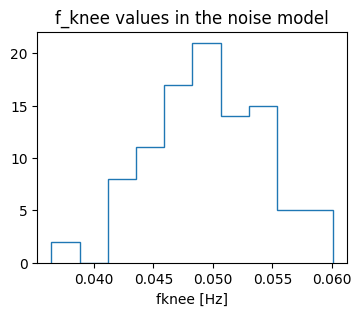

In [7]:
plt.figure(figsize=(4, 3))
plt.title("f_knee values in the noise model")
plt.hist([ob["noise_model"].fknee(det) for det in dets], histtype="step")
plt.xlabel("fknee [Hz]")
plt.show()

In [8]:
from toast.ops import NoiseEstim, FitNoiseModel

NoiseEstim(out_model="toast_estim_noise", det_data="noise").apply(data)
NoiseEstim(out_model="toast_estim_atm_coarse", det_data="atm_coarse").apply(data)
FitNoiseModel(noise_model="toast_estim_noise", out_model="toast_fit_noise").apply(data)
FitNoiseModel(noise_model="toast_estim_atm_coarse", out_model="toast_fit_atm_coarse").apply(data)

TOAST WARNING: Some PSDs have negative values.  Consider changing noise estimation parameters.
TOAST WARNING: Some PSDs have negative values.  Consider changing noise estimation parameters.
TOAST WARNING: Some PSDs have negative values.  Consider changing noise estimation parameters.
TOAST WARNING: Some PSDs have negative values.  Consider changing noise estimation parameters.


/home/sbiquard/work/pairdiff/simu-sat/.venv/lib/python3.11/site-packages/scipy/optimize/_lsq/common.py:115: RuntimeWarning: overflow encountered in power
  phi_prime = -np.sum(suf ** 2 / denom**3) / p_norm
/home/sbiquard/work/pairdiff/simu-sat/.venv/lib/python3.11/site-packages/scipy/optimize/_lsq/common.py:154: RuntimeWarning: invalid value encountered in scalar divide
  ratio = phi / phi_prime
/home/sbiquard/work/pairdiff/simu-sat/.venv/lib/python3.11/site-packages/scipy/optimize/_lsq/common.py:398: RuntimeWarning: invalid value encountered in cast
  return min_step, np.equal(steps, min_step) * np.sign(s).astype(int)
/home/sbiquard/work/pairdiff/simu-sat/.venv/lib/python3.11/site-packages/scipy/optimize/_lsq/trf.py:363: RuntimeWarning: divide by zero encountered in scalar divide
  alpha *= Delta / Delta_new
/home/sbiquard/work/pairdiff/simu-sat/.venv/lib/python3.11/site-packages/scipy/optimize/_lsq/common.py:132: RuntimeWarning: divide by zero encountered in scalar divide
  alpha_upp

TOAST WARNING: Some PSDs have negative values.  Consider changing noise estimation parameters.
TOAST WARNING: Some PSDs have negative values.  Consider changing noise estimation parameters.
TOAST WARNING: Some PSDs have negative values.  Consider changing noise estimation parameters.
TOAST WARNING: Some PSDs have negative values.  Consider changing noise estimation parameters.
TOAST WARNING: Some PSDs have negative values.  Consider changing noise estimation parameters.
TOAST WARNING: Some PSDs have negative values.  Consider changing noise estimation parameters.
TOAST WARNING: Some PSDs have negative values.  Consider changing noise estimation parameters.
TOAST WARNING: Some PSDs have negative values.  Consider changing noise estimation parameters.
TOAST WARNING: Some PSDs have negative values.  Consider changing noise estimation parameters.
TOAST WARNING: Some PSDs have negative values.  Consider changing noise estimation parameters.
TOAST WARNING: Some PSDs have negative values.  Co

In [9]:
t = ob.shared["times"].data  # time in seconds
t -= t[0]
t /= 60  # minutes

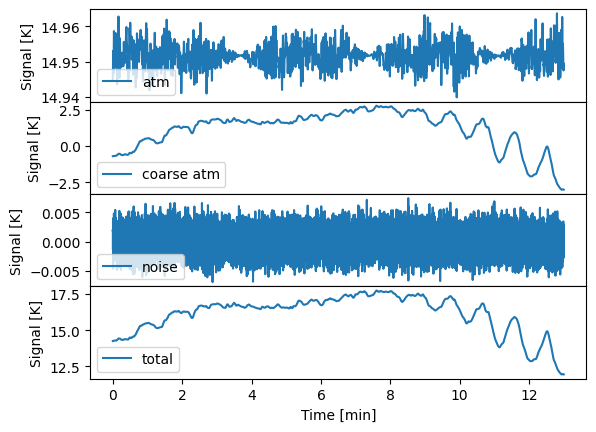

In [10]:
fig, axs = plt.subplots(4, 1, sharex=True)
fig.subplots_adjust(hspace=0)

axs[0].plot(t, ob.detdata["atm"][0], label="atm")
axs[1].plot(t, ob.detdata["atm_coarse"][0], label="coarse atm")
axs[2].plot(t, ob.detdata["noise"][0], label="noise")
axs[-1].plot(t, ob.detdata["atm"][0] + ob.detdata["atm_coarse"][0], label="total")

for ax in axs.flat:
    ax.set(xlabel="Time [min]", ylabel="Signal [K]")
    ax.label_outer()
    ax.legend(loc="lower left")

plt.show()

In [11]:
white_noise_level = 1e-4
rng = np.random.default_rng()
white_noise_data = rng.normal(0, white_noise_level, t.size)
tods = {}
tods["atm"] = ob.detdata["atm"][0] + ob.detdata["atm_coarse"][0] + white_noise_data
tods["inst"] = ob.detdata["noise"][0]

In [12]:
def estimate_net(Pxx_):
    """Use 20% (up to 100) points from the end of the PSD to estimate the NET."""
    n = len(Pxx_)
    offset = max(n - 100, int(0.8 * n))
    net = np.sqrt(np.mean(Pxx_[offset:]))
    # print(f"{n=}, {offset=}, {net=:.2e}")
    return net

In [13]:
npersegs = {
    "10 min": int(rate * 600),
    "5 min": int(rate * 300),
    "1 min": int(rate * 60),
    "default": None,
}
f, Pxx = {k: {} for k in tods}, {k: {} for k in tods}
for k, tod in tods.items():
    for label, nperseg in npersegs.items():
        f[k][label], Pxx[k][label] = signal.welch(tod, fs=rate, nperseg=nperseg)

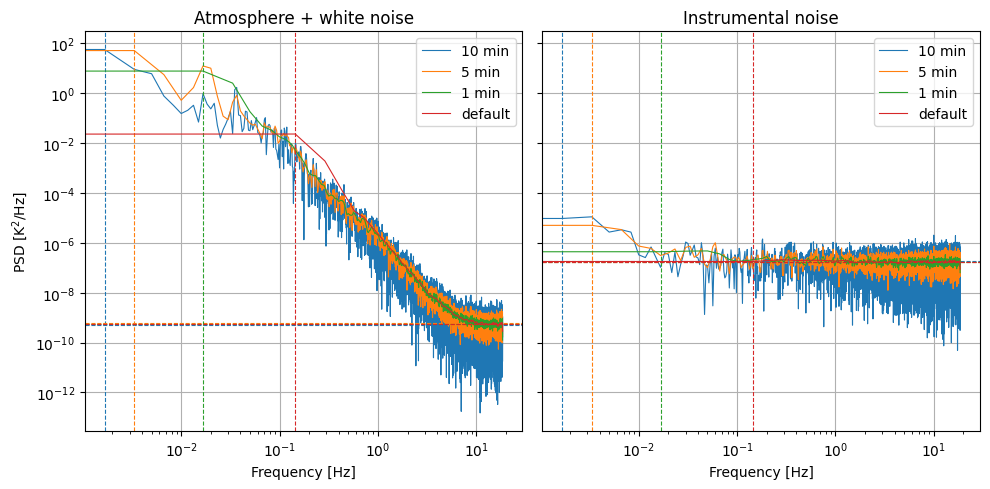

In [14]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
for ax, tod in zip(axs, tods):
    for label, nperseg in npersegs.items():
        _l = ax.loglog(f[tod][label], Pxx[tod][label], label=label, lw=0.8)
        ax.axvline(f[tod][label][1], color=_l[0].get_color(), ls="--", lw=0.8)
        ax.axhline(estimate_net(Pxx[tod][label])**2, color=_l[0].get_color(), ls="--", lw=0.8)
    ax.legend()
    ax.grid(True)
# plt.axvline(guess_freq, color="k", ls="--", label=f"{guess_freq} Hz")
axs[0].set(title="Atmosphere + white noise", xlabel="Frequency [Hz]", ylabel="PSD [K$^2$/Hz]")
axs[1].set(title="Instrumental noise", xlabel="Frequency [Hz]")
fig.tight_layout()
plt.show()

In [15]:
def _log_model(x, sigma, alpha, fk, f0):
    return 2 * np.log10(sigma) + np.log10(1 + ((x + f0) / fk) ** -alpha)
    # return 2 * np.log10(sigma) + np.log10(1 + (x**-alpha + f0**-alpha) / (x**-alpha + fk**-alpha))


def _log_model_prior(x, sigma, alpha, fk, f0):
    if f0 > fk:
        return -np.inf
    return _log_model(x, sigma, alpha, fk, f0)

In [16]:
def fit_model(f, Pxx):
    f_ = f[1:]
    Pxx_ = Pxx[1:]
    p0 = [
        estimate_net(Pxx_),  # sigma
        1.0,  # alpha
        0.1 * f_[-1],  # fknee
        0,  # f0
    ]
    bounds = (
        [0, 0.1, 0.1 * f_[-1], 0],
        [np.inf, 10, f_[-1], 0.1 * f_[-1]],
    )
    # func = _log_model_prior if fit_for_f0 else partial(_log_model, f0=0)
    # idx = 1 if min_freq is None else np.searchsorted(f, min_freq)
    popt, pcov = curve_fit(
        _log_model,
        f_,
        np.log10(Pxx_),
        p0=p0,
        bounds=bounds,
        x_scale=[1e-5, 1, 1, 1e-2],  # if fit_for_f0 else [1e-5, 1, 1],
        nan_policy="raise",
    )
    return popt, pcov


def _model(x, sigma, alpha, fk, f0):
    return sigma**2 * (1 + ((x + f0) / fk) ** -alpha)

In [17]:
def fit_model_lmfit(f_, Pxx_, fit_for_net=True, fit_for_f0=True):
    # remove lowest frequencies
    # offset = int(0.02 * len(f_))
    offset = 1
    input_freqs = f_[offset:]
    input_Pxx = Pxx_[offset:]

    params = lmfit.Parameters()
    # fix sigma to the estimated NET
    if fit_for_net:
        params.add("sigma", value=estimate_net(input_Pxx), min=0)
    else:
        params.add("sigma", value=estimate_net(input_Pxx), vary=False)
    # slope between 0.01 and 10
    params.add("alpha", value=1.0, min=0.01, max=10.0)
    # knee frequency
    params.add("fk", value=0.5 * input_freqs[-1], min=0, max=input_freqs[-1])
    # rolloff frequency
    if fit_for_f0:
        params.add("f0", value=0.0, min=input_freqs[0], max=0.1 * input_freqs[-1])
    else:
        params.add("f0", value=0.0, vary=False)

    def residual(pars, x, data):
        parvals = pars.valuesdict()
        model = _log_model(
            x, parvals["sigma"], parvals["alpha"], parvals["fk"], parvals.get("f0", 0)
        )
        return model - data

    result = lmfit.minimize(residual, params, args=(input_freqs, np.log10(input_Pxx)), reduce_fcn="neglogcauchy")
    # print(lmfit.fit_report(result))
    # print("\n")
    return result.params.valuesdict()

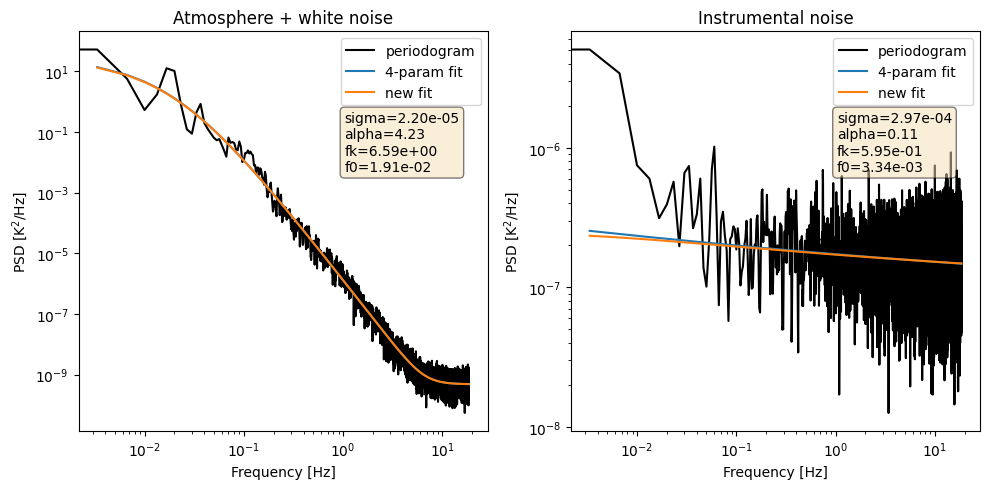

In [18]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
_label = "5 min"

axs[0].set(title="Atmosphere + white noise", xlabel="Frequency [Hz]", ylabel="PSD [K$^2$/Hz]")
axs[1].set(title="Instrumental noise", xlabel="Frequency [Hz]", ylabel="PSD [K$^2$/Hz]")

for ax, tod in zip(axs, tods):
    _f = f[tod][_label]
    _Pxx = Pxx[tod][_label]
    ax.plot(_f, _Pxx, color="k", label="periodogram")

    # fit with 4 parameters
    popt, pcov = fit_model(_f, _Pxx)  #, f0_fk_pivot=1)
    ax.plot(_f[1:], _model(_f[1:], *popt), label="4-param fit")
    # print(popt)

    # alternative fit
    popt_lmfit = fit_model_lmfit(_f, _Pxx)
    ax.plot(_f[1:], _model(_f[1:], *popt_lmfit.values()), label="new fit")

    textstr = "\n".join(
        (
            f"sigma={popt_lmfit['sigma']:.2e}",
            f"alpha={popt_lmfit['alpha']:.2f}",
            f"fk={popt_lmfit['fk']:.2e}",
            f"f0={popt_lmfit['f0']:.2e}",
        )
    )

    props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)
    ax.text(
        0.65,
        0.8,
        textstr,
        transform=ax.transAxes,
        # fontsize=14,
        verticalalignment="top",
        bbox=props,
    )

    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.legend()
fig.tight_layout()
plt.show()

In [19]:
def add_box_with_lmfit_results(popt, ax):
    textstr = "\n".join(
        (
            f"sigma={popt[0]:.2e} K^2",
            f"alpha={popt[1]:.2f}",
            f"fk={popt[2]:.2e} Hz",
            f"f0={popt[3]:.2e} Hz",
        )
    )

    props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)
    ax.text(
        0.65,
        0.8,
        textstr,
        transform=ax.transAxes,
        fontsize=10,
        verticalalignment="top",
        bbox=props,
    )

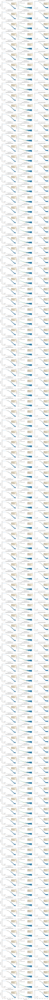

In [20]:
ncol = 3  # atm, noise, both
slc = slice(0, len(dets))
nrow = slc.stop - slc.start
fig, axs = plt.subplots(nrow, ncol, figsize=(6 * ncol, 4 * nrow), sharex=True, sharey="col")
fig.subplots_adjust(hspace=0.25, wspace=0.2)

for idet, det in enumerate(dets[slc]):
    tod_atm = ob.detdata["atm"][idet] + ob.detdata["atm_coarse"][idet] + white_noise_data
    tod_noise = ob.detdata["noise"][idet]
    tod_sum = tod_atm + tod_noise
    f_atm, Pxx_atm = signal.welch(tod_atm, fs=rate, nperseg=npersegs["5 min"])
    f_noise, Pxx_noise = signal.welch(tod_noise, fs=rate, nperseg=npersegs["5 min"])
    f_sum, Pxx_sum = signal.welch(tod_sum, fs=rate, nperseg=npersegs["5 min"])
    # popt_atm = fit_model_lmfit(f_atm, Pxx_atm)
    # popt_noise = fit_model_lmfit(f_noise, Pxx_noise)
    # popt_sum = fit_model_lmfit(f_sum, Pxx_sum)
    popt_atm, _ = fit_model(f_atm, Pxx_atm)
    popt_noise, _ = fit_model(f_noise, Pxx_noise)
    popt_sum, _ = fit_model(f_sum, Pxx_sum)
    axs.flat[3 * idet].set(title=f"[{slc.start + idet}] {det}")
    # axs.flat[3 * idet].loglog(ob["toast_estim_atm_coarse"].freq(det), ob["toast_estim_atm_coarse"].psd(det), color="k", label="toast estimation")
    # axs.flat[3 * idet].loglog(ob["toast_fit_atm_coarse"].freq(det), ob["toast_fit_atm_coarse"].psd(det), color="r", label="toast fit")
    axs.flat[3 * idet].loglog(f_atm, Pxx_atm, label="welch")
    axs.flat[3 * idet].loglog(f_atm[1:], _model(f_atm[1:], *popt_atm), label="fit")
    add_box_with_lmfit_results(popt_atm, axs.flat[3 * idet])
    axs.flat[3 * idet].legend()
    axs.flat[3 * idet].set_xlim(left=1e-3)
    axs.flat[3 * idet].set_ylim(top=1e4)
    axs.flat[3 * idet].set(xlabel="Frequency [Hz]", ylabel="PSD [K$^2$/Hz]")
    axs.flat[3 * idet + 1].set(title=f"[{slc.start + idet}] {det}")
    # axs.flat[3 * idet + 1].loglog(ob["toast_estim_noise"].freq(det), ob["toast_estim_noise"].psd(det), color="k", label="toast estimation")
    # axs.flat[3 * idet + 1].loglog(ob["toast_fit_noise"].freq(det), ob["toast_fit_noise"].psd(det), color="r", label="toast fit")
    axs.flat[3 * idet + 1].loglog(f_noise, Pxx_noise, label="welch")
    axs.flat[3 * idet + 1].loglog(f_noise[1:], _model(f_noise[1:], *popt_noise), label="fit")
    axs.flat[3 * idet + 1].loglog(ob["noise_model"].freq(det), ob["noise_model"].psd(det), color="g", label="initial noise model")
    add_box_with_lmfit_results(popt_noise, axs.flat[3 * idet + 1])
    axs.flat[3 * idet + 1].legend()
    axs.flat[3 * idet + 1].set_xlim(left=1e-4)
    axs.flat[3 * idet + 1].set_ylim(top=1e-1)
    axs.flat[3 * idet + 1].set(xlabel="Frequency [Hz]", ylabel="PSD [K$^2$/Hz]")
    axs.flat[3 * idet + 2].set(title=f"[{slc.start + idet}] {det}")
    axs.flat[3 * idet + 2].loglog(f_sum, Pxx_sum, label="welch")
    axs.flat[3 * idet + 2].loglog(f_sum[1:], _model(f_sum[1:], *popt_sum), label="fit")
    add_box_with_lmfit_results(popt_sum, axs.flat[3 * idet + 2])
    axs.flat[3 * idet + 2].legend()